# ASL Notebook: EDA, Preprocessing, Training, and Analysis

Hi notebook. In this file I do the full workflow for the ASL hand sign dataset:
- understand the data
- preprocess the images
- train a CNN model
- evaluate the model
- inspect where the model looks and where it gets confused

The writing is simple on purpose. We are doing machine learning, not auditioning for Shakespeare.

In [76]:
%pip install -i https://package-mirror.liara.ir/repository/pypi/simple pandas numpy matplotlib seaborn pillow scikit-learn

%pip install -i https://package-mirror.liara.ir/repository/pypi/simple torch torchvision torchviz torch-summary


Looking in indexes: https://package-mirror.liara.ir/repository/pypi/simple

[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Looking in indexes: https://package-mirror.liara.ir/repository/pypi/simple

[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import json
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageEnhance
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings("ignore", category=RuntimeWarning, module="scipy")

sns.set_theme(style="whitegrid")
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 120)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

print(f"Random seed fixed at {SEED} for reproducibility.")
print("Random seed fixed. The notebook is awake and ready.")


Random seed fixed at 42 for reproducibility.
Random seed fixed. The notebook is awake and ready.
Heavy deep-learning imports are delayed, so this part stays fast on Mac.


In [ ]:
from IPython.display import HTML, display

display(HTML("""
<style>
    .jp-Notebook, .notebook-app {
        background: linear-gradient(180deg, #f8fafc 0%, #eef2ff 100%);
    }
    .jp-Cell, .cell {
        border-radius: 16px;
    }
    .jp-MarkdownCell, .text_cell_render {
        font-family: Inter, -apple-system, BlinkMacSystemFont, Segoe UI, sans-serif;
        line-height: 1.7;
    }
    .jp-RenderedMarkdown h1, .jp-RenderedMarkdown h2, .jp-RenderedMarkdown h3 {
        color: #0f172a;
        font-weight: 800;
        letter-spacing: -0.02em;
    }
    .jp-RenderedMarkdown p, .jp-RenderedMarkdown li {
        color: #334155;
        font-size: 15px;
    }
    .jp-CodeCell .input_area, .code_cell .input_area {
        border-radius: 14px;
        border: 1px solid #dbeafe;
        background: #f8fafc;
    }
    .jp-OutputArea-output, .output_area {
        border-radius: 14px;
    }
    .jp-RenderedMarkdown code, .jp-RenderedHTMLCommon code {
        background: #e2e8f0;
        color: #0f172a;
        padding: 2px 6px;
        border-radius: 8px;
    }
</style>
"""))

plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "#cbd5e1",
    "axes.labelcolor": "#0f172a",
    "axes.titleweight": "bold",
    "axes.titlepad": 12,
    "xtick.color": "#334155",
    "ytick.color": "#334155",
    "grid.color": "#e2e8f0",
    "font.size": 11,
})

print("Notebook style loaded. Clean, soft, and a little bit fancy.")


Notebook style loaded. Clean, soft, and a little bit fancy.


## Preprocessing choices

Before touching the model, I need one clean preprocessing pipeline.

### Cropping
I crop each image using the given bounding box. This keeps the hand and removes a lot of useless background.

### Resizing
I resize all cropped images to **128 x 128**.

Why `128 x 128`?
- `64 x 64` is faster, but maybe too small for finger details
- `224 x 224` is common in bigger models, but it is heavier than I need here
- `128 x 128` is a nice middle choice

### Normalization
I scale pixel values to **[0, 1]** by dividing by `255`.

Why this one?
- easy to explain
- common in image work
- simple and clean for homework

### Augmentation
I apply augmentation **only** on the training set.
That helps the model generalize better without cheating on validation or test data. We respect the rules here. Mostly.

In [4]:
DATASET_DIR = Path("dataset")
SPLIT_DIRS = {
    "train": DATASET_DIR / "train",
    "valid": DATASET_DIR / "valid",
    "test": DATASET_DIR / "test",
}
CSV_COLUMNS = ["image_name", "x_min", "y_min", "x_max", "y_max", "label"]
TARGET_SIZE = (128, 128)

for split_name, split_dir in SPLIT_DIRS.items():
    print(split_name, "->", split_dir)

train -> dataset/train
valid -> dataset/valid
test -> dataset/test


In [5]:
def load_split_annotations(split_name: str) -> pd.DataFrame:
    split_dir = SPLIT_DIRS[split_name]
    csv_path = split_dir / "_annotations.csv"

    df = pd.read_csv(csv_path, header=None, names=CSV_COLUMNS)
    df["split"] = split_name
    df["image_path"] = df["image_name"].apply(lambda name: split_dir / name)
    df[["x_min", "y_min", "x_max", "y_max"]] = df[["x_min", "y_min", "x_max", "y_max"]].astype(int)
    return df


annotations = pd.concat(
    [load_split_annotations(split_name) for split_name in SPLIT_DIRS],
    ignore_index=True,
)

annotations.head()

,image_name,x_min,y_min,x_max,y_max,label,split,image_path
0,K4_jpg.rf.00821732715c9137b8060360770ea1d8.jpg,42,12,351,369,K,train,dataset/train/K4_jpg.rf.00821732715c9137b80603...
1,W6_jpg.rf.00d19bc3a49f6469e2afa3aa92f14ff4.jpg,22,73,377,412,W,train,dataset/train/W6_jpg.rf.00d19bc3a49f6469e2afa3...
2,J30_jpg.rf.00d20e595026b31773ded47509545471.jpg,122,204,250,334,J,train,dataset/train/J30_jpg.rf.00d20e595026b31773ded...
3,P12_jpg.rf.0046c1c30abbbccd31716c5b2ad835b9.jpg,84,203,330,332,P,train,dataset/train/P12_jpg.rf.0046c1c30abbbccd31716...
4,N23_jpg.rf.01428a442131e7dcbdb4453df83877e0.jpg,105,62,306,261,N,train,dataset/train/N23_jpg.rf.01428a442131e7dcbdb44...


## Dataset overview

First I want basic answers:
- how many samples do I have?
- how many classes are there?
- are the splits balanced?
- do some letters appear more than others?

This part is important because bad balance can quietly hurt the model later. Silent damage. Like stepping on Lego.

In [6]:
split_summary = (
    annotations.groupby("split")
    .agg(samples=("image_name", "count"), classes=("label", "nunique"))
    .reset_index()
)

print("Quick dataset check:")
display(split_summary)

print("Total samples:", len(annotations))
print("Total unique classes:", annotations["label"].nunique())
print("Classes found:", sorted(annotations["label"].unique()))


Quick dataset check:


,split,samples,classes
0,test,72,24
1,train,1512,26
2,valid,144,26


Total samples: 1728
Total unique classes: 26
Classes found: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


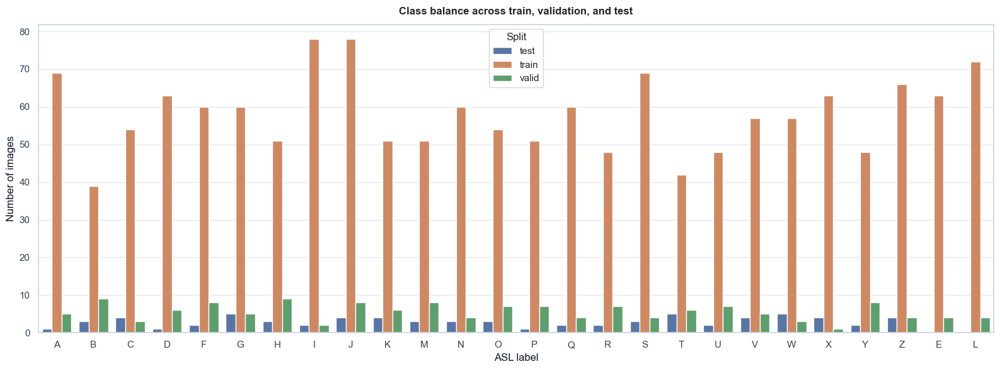

In [7]:
class_counts = (
    annotations.groupby(["split", "label"]) 
    .size()
    .reset_index(name="count")
)

plt.figure(figsize=(16, 6))
sns.barplot(data=class_counts, x="label", y="count", hue="split")
plt.title("Class balance across train, validation, and test")
plt.xlabel("ASL label")
plt.ylabel("Number of images")
plt.legend(title="Split")
plt.tight_layout()
plt.show()

### How I talk about the class plot

When I look at the class distribution plot, I do not just paste it and move on like nothing happened.
I check:
- classes with much fewer images
- whether train, validation, and test look similar
- whether any class is missing in one split

If I see imbalance, I say it clearly in the report. That can help explain why some letters later get lower recall or lower F1.

In [8]:
def get_image_size(image_path: Path):
    with Image.open(image_path) as image:
        return image.size  # (width, height)


size_records = []
for image_path in annotations["image_path"]:
    width, height = get_image_size(image_path)
    size_records.append((width, height))

annotations[["image_width", "image_height"]] = pd.DataFrame(size_records, index=annotations.index)
annotations["bbox_width"] = annotations["x_max"] - annotations["x_min"]
annotations["bbox_height"] = annotations["y_max"] - annotations["y_min"]
annotations["bbox_area"] = annotations["bbox_width"] * annotations["bbox_height"]
annotations["image_area"] = annotations["image_width"] * annotations["image_height"]
annotations["bbox_area_ratio"] = annotations["bbox_area"] / annotations["image_area"]

annotations.head()

,image_name,x_min,y_min,x_max,y_max,label,split,image_path,image_width,image_height,bbox_width,bbox_height,bbox_area,image_area,bbox_area_ratio
0,K4_jpg.rf.00821732715c9137b8060360770ea1d8.jpg,42,12,351,369,K,train,dataset/train/K4_jpg.rf.00821732715c9137b80603...,372,372,309,357,110313,138384,0.797151
1,W6_jpg.rf.00d19bc3a49f6469e2afa3aa92f14ff4.jpg,22,73,377,412,W,train,dataset/train/W6_jpg.rf.00d19bc3a49f6469e2afa3...,412,412,355,339,120345,169744,0.708979
2,J30_jpg.rf.00d20e595026b31773ded47509545471.jpg,122,204,250,334,J,train,dataset/train/J30_jpg.rf.00d20e595026b31773ded...,382,382,128,130,16640,145924,0.114032
3,P12_jpg.rf.0046c1c30abbbccd31716c5b2ad835b9.jpg,84,203,330,332,P,train,dataset/train/P12_jpg.rf.0046c1c30abbbccd31716...,372,372,246,129,31734,138384,0.229318
4,N23_jpg.rf.01428a442131e7dcbdb4453df83877e0.jpg,105,62,306,261,N,train,dataset/train/N23_jpg.rf.01428a442131e7dcbdb44...,388,388,201,199,39999,150544,0.265696


## Bounding box analysis

Here I study the bounding boxes.

Questions I care about:
- are the boxes mostly similar in size?
- are some boxes too tiny or too huge?
- how much of the image does the hand occupy?
- are there any weird annotation problems?

This matters because the whole pipeline depends on the crop being sensible. If the crop is bad, the model is basically studying chaos.

In [9]:
bbox_summary = annotations[[
    "bbox_width", "bbox_height", "bbox_area", "bbox_area_ratio", "image_width", "image_height"
]].describe().T

bbox_summary

,count,mean,std,min,25%,50%,75%,max
bbox_width,1728.0,222.599537,63.518140,74.000000,175.000000,217.000000,269.000000,404.000000
bbox_height,1728.0,210.689815,69.247957,59.000000,158.000000,203.000000,257.000000,414.000000
bbox_area,1728.0,49349.843171,26294.915067,5550.000000,30012.000000,44464.500000,62766.750000,141804.000000
bbox_area_ratio,1728.0,0.315869,0.170154,0.035787,0.189482,0.285751,0.397085,0.966051
image_width,1728.0,396.118056,13.939399,372.000000,384.000000,396.000000,408.000000,416.000000
image_height,1728.0,396.118056,13.939399,372.000000,384.000000,396.000000,408.000000,416.000000


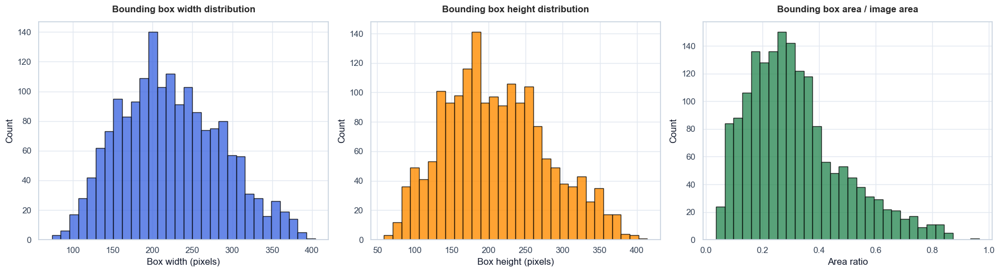

In [10]:
plot_data = annotations[["bbox_width", "bbox_height", "bbox_area_ratio"]].replace([np.inf, -np.inf], np.nan).dropna()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(plot_data["bbox_width"], bins=30, color="royalblue", edgecolor="black", alpha=0.8)
axes[0].set_title("Bounding box width distribution")
axes[0].set_xlabel("Box width (pixels)")
axes[0].set_ylabel("Count")

axes[1].hist(plot_data["bbox_height"], bins=30, color="darkorange", edgecolor="black", alpha=0.8)
axes[1].set_title("Bounding box height distribution")
axes[1].set_xlabel("Box height (pixels)")
axes[1].set_ylabel("Count")

axes[2].hist(plot_data["bbox_area_ratio"], bins=30, color="seagreen", edgecolor="black", alpha=0.8)
axes[2].set_title("Bounding box area / image area")
axes[2].set_xlabel("Area ratio")
axes[2].set_ylabel("Count")

plt.tight_layout()
plt.show()


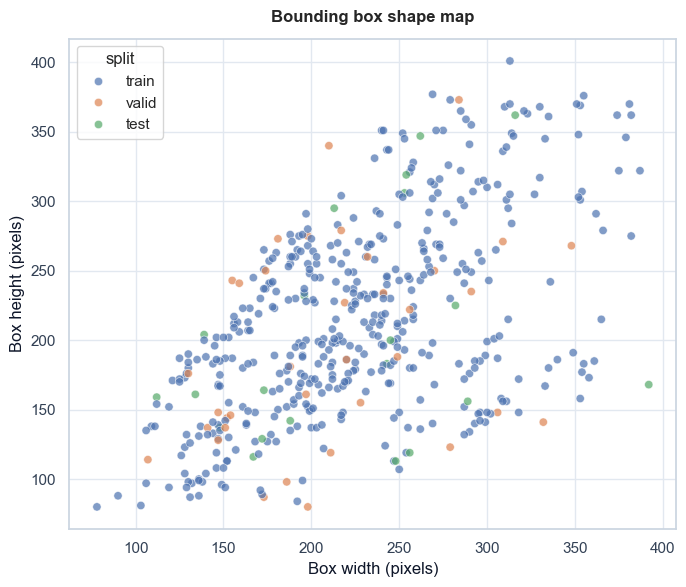

In [11]:
scatter_data = annotations[["bbox_width", "bbox_height", "split"]].replace([np.inf, -np.inf], np.nan).dropna()
scatter_data = scatter_data.sample(min(500, len(scatter_data)), random_state=SEED)

plt.figure(figsize=(7, 6))
sns.scatterplot(
    data=scatter_data,
    x="bbox_width",
    y="bbox_height",
    hue="split",
    alpha=0.7,
)
plt.title("Bounding box shape map")
plt.xlabel("Box width (pixels)")
plt.ylabel("Box height (pixels)")
plt.tight_layout()
plt.show()


### What I write from this section

After running these plots, I write a few short observations based on the real output.
Examples:
- most bounding boxes are medium to large, so the hand usually takes a meaningful part of the image
- a few boxes are unusually small or large, which may make some samples harder
- the crop sizes are reasonably consistent, which is good for model training

The key idea is simple: I connect my words to the actual numbers and plots. No fake wisdom. Real wisdom only.

In [12]:
quality_checks = pd.DataFrame({
    "missing_file": ~annotations["image_path"].apply(Path.exists),
    "invalid_x_order": annotations["x_min"] >= annotations["x_max"],
    "invalid_y_order": annotations["y_min"] >= annotations["y_max"],
    "negative_coord": (annotations[["x_min", "y_min", "x_max", "y_max"]] < 0).any(axis=1),
    "x_out_of_bounds": annotations["x_max"] > annotations["image_width"],
    "y_out_of_bounds": annotations["y_max"] > annotations["image_height"],
})

quality_summary = quality_checks.sum().rename("count").to_frame()
quality_summary

,count
missing_file,0
invalid_x_order,0
invalid_y_order,0
negative_coord,0
x_out_of_bounds,0
y_out_of_bounds,0


## Data quality checks

This section checks simple but important things:
- missing image files
- broken box order like `x_min >= x_max`
- negative coordinates
- coordinates that go outside image borders

If the counts are zero, that is great news. For once, the dataset behaves like a responsible adult.

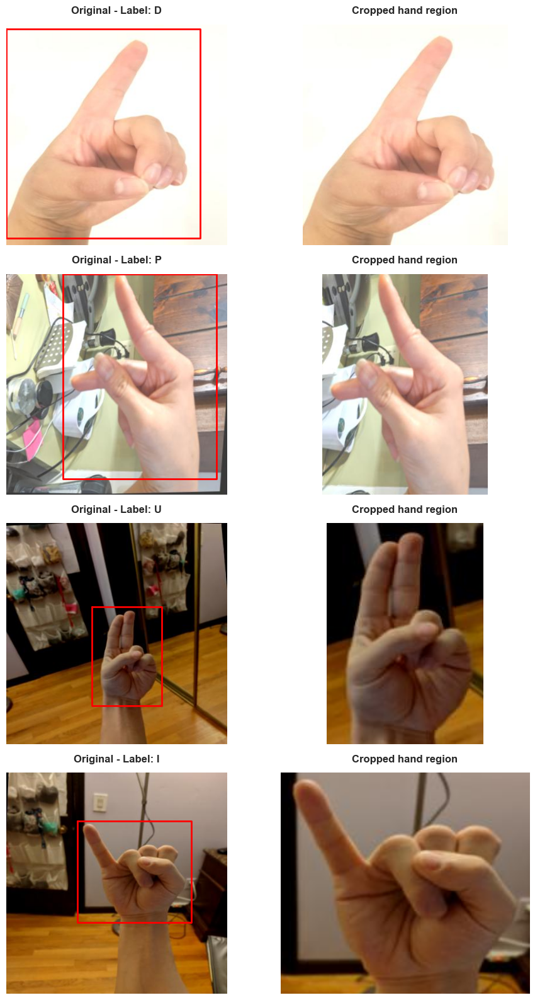

In [13]:
def show_samples_with_boxes(df: pd.DataFrame, split_name: str, n: int = 6, random_state: int = SEED):
    sample_df = df[df["split"] == split_name].sample(n=min(n, len(df[df["split"] == split_name])), random_state=random_state)

    fig, axes = plt.subplots(len(sample_df), 2, figsize=(10, 4 * len(sample_df)))
    if len(sample_df) == 1:
        axes = np.array([axes])

    for row_index, (_, row) in enumerate(sample_df.iterrows()):
        with Image.open(row["image_path"]) as image:
            image = image.convert("RGB")
            image_array = np.array(image)
            cropped = image.crop((row["x_min"], row["y_min"], row["x_max"], row["y_max"]))

        axes[row_index, 0].imshow(image_array)
        rect_x = [row["x_min"], row["x_max"], row["x_max"], row["x_min"], row["x_min"]]
        rect_y = [row["y_min"], row["y_min"], row["y_max"], row["y_max"], row["y_min"]]
        axes[row_index, 0].plot(rect_x, rect_y, color="red", linewidth=2)
        axes[row_index, 0].set_title(f"Original - Label: {row['label']}")
        axes[row_index, 0].axis("off")

        axes[row_index, 1].imshow(cropped)
        axes[row_index, 1].set_title("Cropped hand region")
        axes[row_index, 1].axis("off")

    plt.tight_layout()
    plt.show()


show_samples_with_boxes(annotations, split_name="train", n=4)

## Reproducible preprocessing pipeline

Now I turn the earlier decisions into actual code.

The same main steps are used for all splits:
1. load image
2. crop using bounding box
3. resize to `128 x 128`
4. convert to array
5. normalize to `[0, 1]`

Then only for training data, I optionally apply augmentation.
That keeps the pipeline fair and reproducible.

In [14]:
def clamp_bbox(row, image_width, image_height):
    x_min = max(0, min(int(row["x_min"]), image_width - 1))
    y_min = max(0, min(int(row["y_min"]), image_height - 1))
    x_max = max(x_min + 1, min(int(row["x_max"]), image_width))
    y_max = max(y_min + 1, min(int(row["y_max"]), image_height))
    return x_min, y_min, x_max, y_max


def crop_resize_normalize(image_path: Path, row: pd.Series, target_size=TARGET_SIZE):
    with Image.open(image_path) as image:
        image = image.convert("RGB")
        image_width, image_height = image.size
        x_min, y_min, x_max, y_max = clamp_bbox(row, image_width, image_height)
        cropped = image.crop((x_min, y_min, x_max, y_max))
        resized = cropped.resize(target_size)
        array = np.asarray(resized, dtype=np.float32) / 255.0
    return array

In [15]:
def augment_training_image(image_array: np.ndarray, seed: int | None = None) -> np.ndarray:
    rng = random.Random(seed) if seed is not None else random

    image = Image.fromarray((image_array * 255).astype(np.uint8))

    angle = rng.uniform(-15, 15)
    image = image.rotate(angle)

    max_shift = 8
    shift_x = rng.randint(-max_shift, max_shift)
    shift_y = rng.randint(-max_shift, max_shift)
    translated = Image.new("RGB", image.size, (0, 0, 0))
    translated.paste(image, (shift_x, shift_y))
    image = translated

    brightness_factor = rng.uniform(0.8, 1.2)
    image = ImageEnhance.Brightness(image).enhance(brightness_factor)

    augmented = np.asarray(image, dtype=np.float32) / 255.0
    return np.clip(augmented, 0.0, 1.0)

### Why these augmentations?

I use small and realistic augmentations:
- rotation
- translation
- brightness change

Why? Because real hand images are not always perfectly centered, perfectly bright, and perfectly straight like a passport photo.

The goal is to help the model handle natural variation, not to turn the hand into abstract art.

In [16]:
def load_preprocessed_split(split_name: str, apply_augmentation: bool = False):
    df = annotations[annotations["split"] == split_name].reset_index(drop=True)
    images = []
    labels = []

    for _, row in df.iterrows():
        image_array = crop_resize_normalize(row["image_path"], row)

        if split_name == "train" and apply_augmentation:
            image_array = augment_training_image(image_array)

        images.append(image_array)
        labels.append(row["label"])

    images = np.stack(images)
    labels = np.array(labels)
    return images, labels, df

In [83]:
train_images, train_labels, train_df = load_preprocessed_split("train", apply_augmentation=False) # False in round 1
valid_images, valid_labels, valid_df = load_preprocessed_split("valid", apply_augmentation=False)
test_images, test_labels, test_df = load_preprocessed_split("test", apply_augmentation=False)

print("Preprocessing finished. Here is the shape check:")
print("Train:", train_images.shape)
print("Validation:", valid_images.shape)
print("Test:", test_images.shape)
print("Pixel range after normalization:", train_images.min(), "to", train_images.max())


Preprocessing finished. Here is the shape check:
Train: (1512, 128, 128, 3)
Validation: (144, 128, 128, 3)
Test: (72, 128, 128, 3)
Pixel range after normalization: 0.0 to 1.0


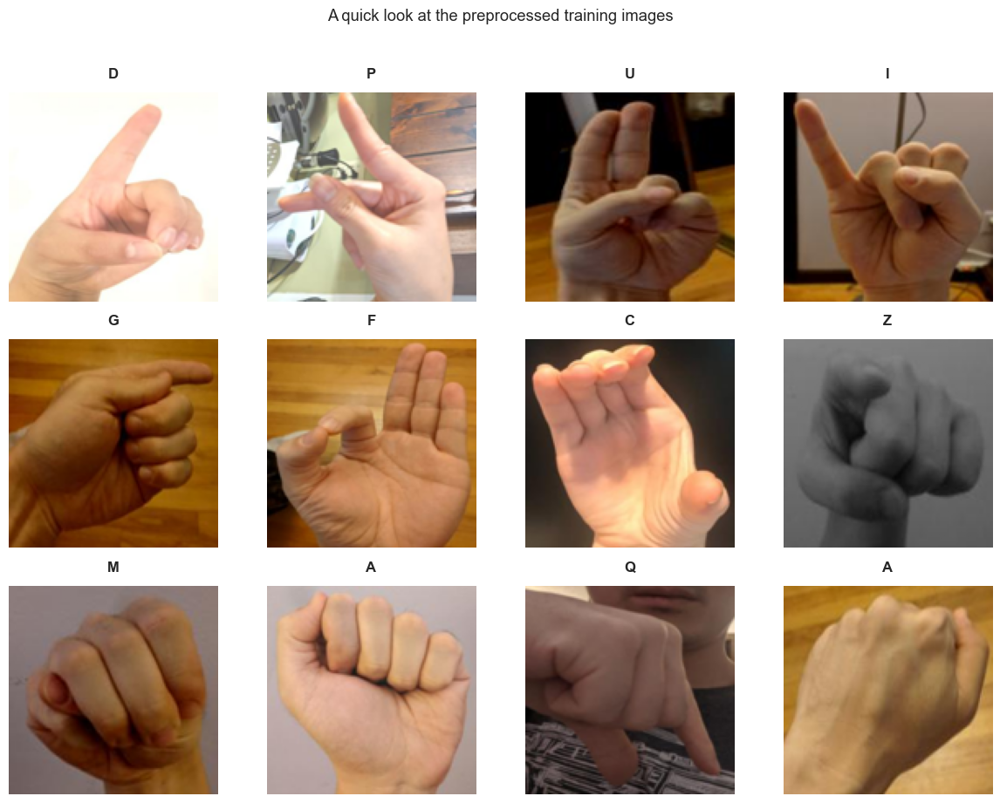

In [18]:
fig, axes = plt.subplots(3, 4, figsize=(12, 9))
sample_indices = np.random.choice(len(train_images), size=min(12, len(train_images)), replace=False)

for axis, index in zip(axes.flat, sample_indices):
    axis.imshow(train_images[index])
    axis.set_title(train_labels[index])
    axis.axis("off")

plt.suptitle("A quick look at the preprocessed training images", y=1.02)
plt.tight_layout()
plt.show()

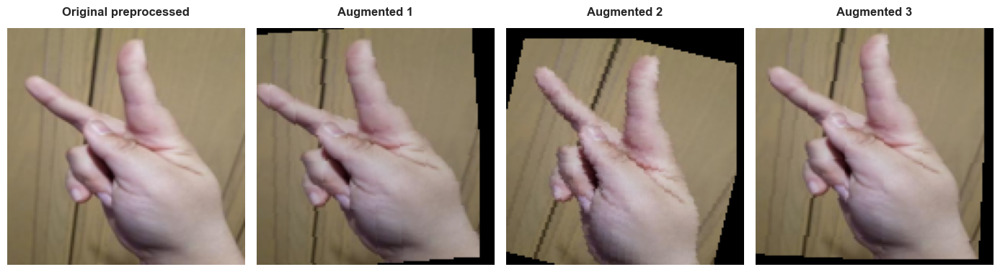

In [19]:
example_index = 0
original_image = train_images[example_index]
augmented_versions = [augment_training_image(original_image, seed=SEED + i) for i in range(3)]

fig, axes = plt.subplots(1, 4, figsize=(14, 4))
axes[0].imshow(original_image)
axes[0].set_title("Original preprocessed")
axes[0].axis("off")

for i, augmented_image in enumerate(augmented_versions, start=1):
    axes[i].imshow(augmented_image)
    axes[i].set_title(f"Augmented {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

## Final preprocessing policy

Final rule set used in this notebook:

- **Train**: crop -> resize -> normalize -> optional augmentation
- **Validation**: crop -> resize -> normalize
- **Test**: crop -> resize -> normalize

This follows the assignment rule that the core feature extraction must be applied consistently to all splits.

# 2.3 CNN Classification with PyTorch

I use **PyTorch** for the model part.

Why PyTorch?
- I like the training loop being explicit
- it feels easier to debug
- it is a good fit for a CPU-only Mac too

Also yes, TensorFlow is powerful. But today PyTorch is the main character.

## Modeling plan

The goal is simple: get strong test accuracy, but also understand the model behavior.

This part includes:
- a CNN classifier
- cross-entropy loss
- AdamW optimizer
- early stopping
- checkpoint saving
- validation and test evaluation

In short: train the model, save the best one, and pray to the gradient gods a little.

In [20]:
# Import PyTorch only now, not at notebook startup.

import copy
import time

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

DEVICE = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
BATCH_SIZE = 16
MAX_EPOCHS = 60
PATIENCE = 10
LEARNING_RATE = 8e-4
WEIGHT_DECAY = 1e-4
LABEL_SMOOTHING = 0.05
CHECKPOINT_PATH = "best_asl_cnn_pytorch.pt"

print("Training setup loaded.")
print("Device:", DEVICE)
print("Batch size:", BATCH_SIZE)
print("Max epochs:", MAX_EPOCHS)
print("Patience:", PATIENCE)
print("Learning rate:", LEARNING_RATE)
print("Checkpoint file:", CHECKPOINT_PATH)

torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


Training setup loaded.
Device: mps
Batch size: 16
Max epochs: 60
Patience: 10
Learning rate: 0.0008
Checkpoint file: best_asl_cnn_pytorch.pt


## Label encoding

The labels are letters like `A`, `B`, `C`, and so on.
The model cannot train on letters directly, so I convert them into integer IDs.

Very glamorous job. Very necessary job.

In [21]:
label_encoder = LabelEncoder()
label_encoder.fit(annotations["label"])

train_label_ids = label_encoder.transform(train_labels)
valid_label_ids = label_encoder.transform(valid_labels)
test_label_ids = label_encoder.transform(test_labels)

class_names = list(label_encoder.classes_)
num_classes = len(class_names)

print("Label encoding ready.")
print("Number of classes:", num_classes)
print("Class names:", class_names)

Label encoding ready.
Number of classes: 26
Class names: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


## PyTorch dataset and augmentation

Here I wrap the images and labels into a PyTorch dataset.

Training data gets augmentation.
Validation and test data stay clean.

That is important because validation and test should measure real performance, not performance after magic tricks.

In [22]:
def random_flip_lr(image_array: np.ndarray, rng: random.Random) -> np.ndarray:
    if rng.random() < 0.5:
        return np.ascontiguousarray(np.fliplr(image_array))
    return image_array


def random_zoom(image_array: np.ndarray, rng: random.Random, zoom_range=(0.9, 1.12)) -> np.ndarray:
    image = Image.fromarray((image_array * 255).astype(np.uint8))
    width, height = image.size
    zoom_factor = rng.uniform(*zoom_range)
    new_width = max(1, int(width * zoom_factor))
    new_height = max(1, int(height * zoom_factor))
    resized = image.resize((new_width, new_height))

    if zoom_factor >= 1.0:
        left = (new_width - width) // 2
        top = (new_height - height) // 2
        resized = resized.crop((left, top, left + width, top + height))
    else:
        canvas = Image.new("RGB", (width, height), (0, 0, 0))
        left = (width - new_width) // 2
        top = (height - new_height) // 2
        canvas.paste(resized, (left, top))
        resized = canvas

    return np.asarray(resized, dtype=np.float32) / 255.0


class ASLDataset(Dataset):
    def __init__(self, images, labels, training=False, seed=SEED):
        self.images = images.astype(np.float32)
        self.labels = labels.astype(np.int64)
        self.training = training
        self.seed = seed

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image = self.images[index].copy()
        label = self.labels[index]

        if self.training:
            rng = random.Random(self.seed + index + random.randint(0, 10_000))
            image = augment_training_image(image)
            image = random_flip_lr(image, rng)
            image = random_zoom(image, rng)
            image = np.clip(image, 0.0, 1.0)

        image_tensor = torch.tensor(image.transpose(2, 0, 1), dtype=torch.float32)
        label_tensor = torch.tensor(label, dtype=torch.long)
        return image_tensor, label_tensor


train_dataset = ASLDataset(train_images, train_label_ids, training=True)
valid_dataset = ASLDataset(valid_images, valid_label_ids, training=False)
test_dataset = ASLDataset(test_images, test_label_ids, training=False)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
valid_loader = DataLoader(valid_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)


In [61]:
len(train_dataset)

1512

## CNN architecture

This CNN is designed to be strong enough to learn hand-shape details, but still reasonable for my hardware.

Main ideas:
- convolution layers learn local visual patterns
- batch normalization helps training stay stable
- pooling reduces spatial size gradually
- dropout helps reduce overfitting

Not too tiny, not too giant. Kind of the "medium fries" of neural networks.

In [23]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout2d(dropout)
        self.shortcut = nn.Identity() if in_channels == out_channels else nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        identity = self.shortcut(x)
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out = self.dropout(out)
        out = self.relu(out + identity)
        return out


class ASLCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
        )
        self.features = nn.Sequential(
            ResidualBlock(32, 32, dropout=0.05),
            nn.MaxPool2d(2),
            ResidualBlock(32, 64, dropout=0.08),
            nn.MaxPool2d(2),
            ResidualBlock(64, 128, dropout=0.10),
            nn.MaxPool2d(2),
            ResidualBlock(128, 192, dropout=0.12),
            nn.MaxPool2d(2),
            ResidualBlock(192, 256, dropout=0.15),
        )
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(256, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.35),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.features(x)
        x = self.classifier(x)
        return x


class_counts = np.bincount(train_label_ids, minlength=num_classes)
class_weights = class_counts.sum() / (num_classes * np.maximum(class_counts, 1))
class_weights = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)

model = ASLCNN(num_classes=num_classes).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=LABEL_SMOOTHING)
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="min", factor=0.5, patience=3, min_lr=1e-6
)

print("Model and class weights are ready.")
print("Class counts:", class_counts.tolist())
print(model)


Model and class weights are ready.
Class counts: [69, 39, 54, 63, 63, 60, 60, 51, 78, 78, 51, 72, 51, 60, 54, 51, 60, 48, 69, 42, 48, 57, 57, 63, 48, 66]
ASLCNN(
  (stem): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (features): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (dropout): Dropout2d(p=0.05, inplace=False)
      (shortcut): Identity()
    )
    (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ce

In [71]:
from torchviz import make_dot

model.to(DEVICE) 

dummy_input = torch.randn(1, 3, 64, 64).to(DEVICE)

model.eval()

y = model(dummy_input)
dot = make_dot(y, params=dict(model.named_parameters()))

try:
    dot.render("asl_model_viz", format="png")
    print("Graph saved successfully!")
except Exception as e:
    print(f"Still need to install graphviz software (brew install graphviz) to save PNG, but graph object created.")


Graph saved successfully!


<img src="./asl_model_viz.png" width="70%">

In [77]:
from torchsummary import summary

_ = summary(model, (3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 32, 64, 64]          --
|    └─Conv2d: 2-1                       [-1, 32, 64, 64]          864
|    └─BatchNorm2d: 2-2                  [-1, 32, 64, 64]          64
|    └─ReLU: 2-3                         [-1, 32, 64, 64]          --
├─Sequential: 1-2                        [-1, 256, 4, 4]           --
|    └─ResidualBlock: 2-4                [-1, 32, 64, 64]          --
|    |    └─Identity: 3-1                [-1, 32, 64, 64]          --
|    |    └─Conv2d: 3-2                  [-1, 32, 64, 64]          9,216
|    |    └─BatchNorm2d: 3-3             [-1, 32, 64, 64]          64
|    |    └─ReLU: 3-4                    [-1, 32, 64, 64]          --
|    |    └─Conv2d: 3-5                  [-1, 32, 64, 64]          9,216
|    |    └─BatchNorm2d: 3-6             [-1, 32, 64, 64]          64
|    |    └─Dropout2d: 3-7               [-1, 32, 64, 64]          --
|    |  

## Training utilities

This part handles the real training work:
- one training epoch
- one validation pass
- accuracy calculation
- gradient clipping
- learning-rate scheduling
- early stopping
- saving the best checkpoint

Basically, this is the engine room.

In [24]:
def run_one_epoch(model, dataloader, criterion, optimizer=None):
    is_training = optimizer is not None
    model.train() if is_training else model.eval()

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    for batch_images, batch_labels in dataloader:
        batch_images = batch_images.to(DEVICE)
        batch_labels = batch_labels.to(DEVICE)

        if is_training:
            optimizer.zero_grad()

        with torch.set_grad_enabled(is_training):
            logits = model(batch_images)
            loss = criterion(logits, batch_labels)

            if is_training:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()

        predictions = logits.argmax(dim=1)
        total_loss += loss.item() * batch_images.size(0)
        total_correct += (predictions == batch_labels).sum().item()
        total_samples += batch_images.size(0)

    average_loss = total_loss / total_samples
    accuracy = total_correct / total_samples
    return average_loss, accuracy


In [25]:
history = {
    "train_loss": [],
    "train_accuracy": [],
    "valid_loss": [],
    "valid_accuracy": [],
    "learning_rate": [],
}

best_valid_accuracy = -1.0
best_model_state = None
best_epoch = 0
patience_counter = 0
best_valid_loss = float("inf")

start_time = time.time()

for epoch in range(1, MAX_EPOCHS + 1):
    current_lr = optimizer.param_groups[0]["lr"]
    train_loss, train_accuracy = run_one_epoch(model, train_loader, criterion, optimizer)
    valid_loss, valid_accuracy = run_one_epoch(model, valid_loader, criterion, optimizer=None)
    scheduler.step(valid_loss)

    history["train_loss"].append(train_loss)
    history["train_accuracy"].append(train_accuracy)
    history["valid_loss"].append(valid_loss)
    history["valid_accuracy"].append(valid_accuracy)
    history["learning_rate"].append(current_lr)

    print(
        f"Epoch {epoch:02d}/{MAX_EPOCHS} | "
        f"lr={current_lr:.6f} | "
        f"train_loss={train_loss:.4f} | train_acc={train_accuracy:.4f} | "
        f"valid_loss={valid_loss:.4f} | valid_acc={valid_accuracy:.4f}"
    )

    if valid_accuracy > best_valid_accuracy:
        best_valid_accuracy = valid_accuracy
        best_model_state = copy.deepcopy(model.state_dict())
        best_epoch = epoch
        torch.save(best_model_state, CHECKPOINT_PATH)
        print(f"  Nice, new best checkpoint saved at epoch {epoch}.")

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        patience_counter = 0
    else:
        patience_counter += 1
        print(f"  Early stopping counter: {patience_counter}/{PATIENCE}")

    if patience_counter >= PATIENCE:
        print("Early stopping triggered. The model said: enough character development.")
        break

training_time_seconds = time.time() - start_time
actual_epochs_used = len(history["train_loss"])

model.load_state_dict(best_model_state)
print("Best epoch:", best_epoch)
print("Best validation accuracy:", f"{best_valid_accuracy:.4f}")
print("Actual epochs used:", actual_epochs_used)
print(f"Training time: {training_time_seconds:.2f} seconds")


Epoch 01/60 | lr=0.000800 | train_loss=3.2877 | train_acc=0.0503 | valid_loss=3.1589 | valid_acc=0.1042
  Nice, new best checkpoint saved at epoch 1.
Epoch 02/60 | lr=0.000800 | train_loss=3.2261 | train_acc=0.0820 | valid_loss=3.1863 | valid_acc=0.0625
  Early stopping counter: 1/10
Epoch 03/60 | lr=0.000800 | train_loss=3.1843 | train_acc=0.0866 | valid_loss=3.2824 | valid_acc=0.0694
  Early stopping counter: 2/10
Epoch 04/60 | lr=0.000800 | train_loss=3.1401 | train_acc=0.0972 | valid_loss=3.1829 | valid_acc=0.0764
  Early stopping counter: 3/10
Epoch 05/60 | lr=0.000800 | train_loss=3.1180 | train_acc=0.1038 | valid_loss=3.2696 | valid_acc=0.0972
  Early stopping counter: 4/10
Epoch 06/60 | lr=0.000400 | train_loss=3.0446 | train_acc=0.1171 | valid_loss=2.9956 | valid_acc=0.0972
Epoch 07/60 | lr=0.000400 | train_loss=3.0196 | train_acc=0.1310 | valid_loss=2.9441 | valid_acc=0.1250
  Nice, new best checkpoint saved at epoch 7.
Epoch 08/60 | lr=0.000400 | train_loss=2.9717 | train_ac

My CPU is at 60°C, yet I’m sweating from the stress of this code running. Who’s the real processor here?

Under pressure and staying chill. Thanks, Apple Silicon!

![temprature](./images/x2.png)

## Learning curves

These plots help me see whether training is going well.

What I look for:
- train loss going down
- validation loss not exploding
- validation accuracy improving
- whether the model starts overfitting later

If the curves look weird, that is the plot twist.

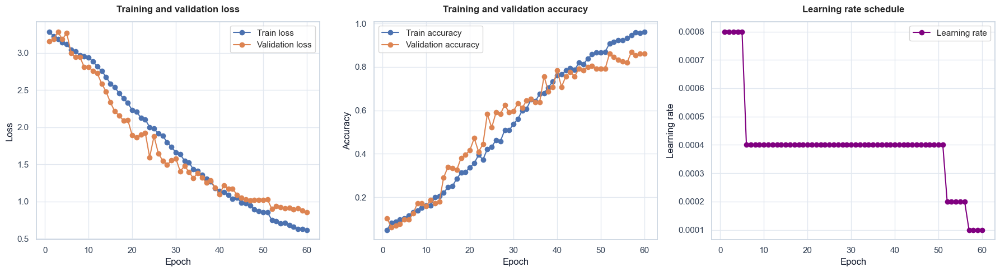

In [26]:
history_df = pd.DataFrame(history)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(history_df.index + 1, history_df["train_loss"], label="Train loss", marker="o")
axes[0].plot(history_df.index + 1, history_df["valid_loss"], label="Validation loss", marker="o")
axes[0].set_title("Training and validation loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].legend()

axes[1].plot(history_df.index + 1, history_df["train_accuracy"], label="Train accuracy", marker="o")
axes[1].plot(history_df.index + 1, history_df["valid_accuracy"], label="Validation accuracy", marker="o")
axes[1].set_title("Training and validation accuracy")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Accuracy")
axes[1].legend()

axes[2].plot(history_df.index + 1, history_df["learning_rate"], label="Learning rate", marker="o", color="purple")
axes[2].set_title("Learning rate schedule")
axes[2].set_xlabel("Epoch")
axes[2].set_ylabel("Learning rate")
axes[2].legend()

plt.tight_layout()
plt.show()


# 2.4 Model Evaluation and Comparative Analysis

Accuracy is important, but it is not enough by itself.
So here I evaluate the final model more carefully.

This section includes:
- overall accuracy
- macro and weighted precision / recall / F1
- confusion matrix
- per-class behavior
- comparison discussion

Because one single number cannot tell the full story. Just like one meme cannot explain an entire semester.

In [27]:
def collect_predictions(model, dataloader):
    model.eval()
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            batch_images = batch_images.to(DEVICE)
            logits = model(batch_images)
            predictions = logits.argmax(dim=1).cpu().numpy()

            all_predictions.extend(predictions)
            all_labels.extend(batch_labels.numpy())

    return np.array(all_labels), np.array(all_predictions)


valid_true, valid_pred = collect_predictions(model, valid_loader)
test_true, test_pred = collect_predictions(model, test_loader)

In [28]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

all_label_ids = np.arange(num_classes)

valid_accuracy = accuracy_score(valid_true, valid_pred)
test_accuracy = accuracy_score(test_true, test_pred)

macro_precision, macro_recall, macro_f1, _ = precision_recall_fscore_support(
    test_true, test_pred, labels=all_label_ids, average="macro", zero_division=0
)
weighted_precision, weighted_recall, weighted_f1, _ = precision_recall_fscore_support(
    test_true, test_pred, labels=all_label_ids, average="weighted", zero_division=0
)

metrics_summary = pd.DataFrame([
    {"metric": "Accuracy", "value": test_accuracy},
    {"metric": "Macro Precision", "value": macro_precision},
    {"metric": "Macro Recall", "value": macro_recall},
    {"metric": "Macro F1", "value": macro_f1},
    {"metric": "Weighted Precision", "value": weighted_precision},
    {"metric": "Weighted Recall", "value": weighted_recall},
    {"metric": "Weighted F1", "value": weighted_f1},
])

metrics_summary


,metric,value
0,Accuracy,0.861111
1,Macro Precision,0.815385
2,Macro Recall,0.789103
3,Macro F1,0.762149
4,Weighted Precision,0.914815
5,Weighted Recall,0.861111
6,Weighted F1,0.853461


In [29]:
print("Final evaluation summary:")
print("Validation accuracy:", f"{valid_accuracy:.4f}")
print("Test accuracy:", f"{test_accuracy:.4f}")
print("Macro Precision:", f"{macro_precision:.4f}")
print("Macro Recall:", f"{macro_recall:.4f}")
print("Macro F1:", f"{macro_f1:.4f}")
print("Weighted Precision:", f"{weighted_precision:.4f}")
print("Weighted Recall:", f"{weighted_recall:.4f}")
print("Weighted F1:", f"{weighted_f1:.4f}")


Final evaluation summary:
Validation accuracy: 0.8681
Test accuracy: 0.8611
Macro Precision: 0.8154
Macro Recall: 0.7891
Macro F1: 0.7621
Weighted Precision: 0.9148
Weighted Recall: 0.8611
Weighted F1: 0.8535


### Model Training Results
i trained the model on mode without data augmentation (`apply_augmentation=False`). so now i want to add augmentations options and then re-train and vs them.

| Metric | Value |
| :--- | :--- |
| **Validation Accuracy** | 0.8681 |
| **Test Accuracy** | 0.8611 |
| **Macro Precision** | 0.8154 |
| **Macro Recall** | 0.7891 |
| **Macro F1-Score** | 0.7621 |
| **Weighted Precision** | 0.9148 |
| **Weighted Recall** | 0.8611 |
| **Weighted F1-Score** | 0.8535 |


In [30]:
report_dict = classification_report(
    test_true,
    test_pred,
    labels=all_label_ids,
    target_names=class_names,
    output_dict=True,
    zero_division=0,
)

per_class_report = pd.DataFrame(report_dict).T
per_class_report


,precision,recall,f1-score,support
A,0.333333,1.000000,0.500000,1.000000
B,0.750000,1.000000,0.857143,3.000000
C,1.000000,1.000000,1.000000,4.000000
D,0.500000,1.000000,0.666667,1.000000
E,0.000000,0.000000,0.000000,0.000000
F,1.000000,0.500000,0.666667,2.000000
G,1.000000,1.000000,1.000000,5.000000
H,0.750000,1.000000,0.857143,3.000000
I,1.000000,0.500000,0.666667,2.000000
J,1.000000,1.000000,1.000000,4.000000


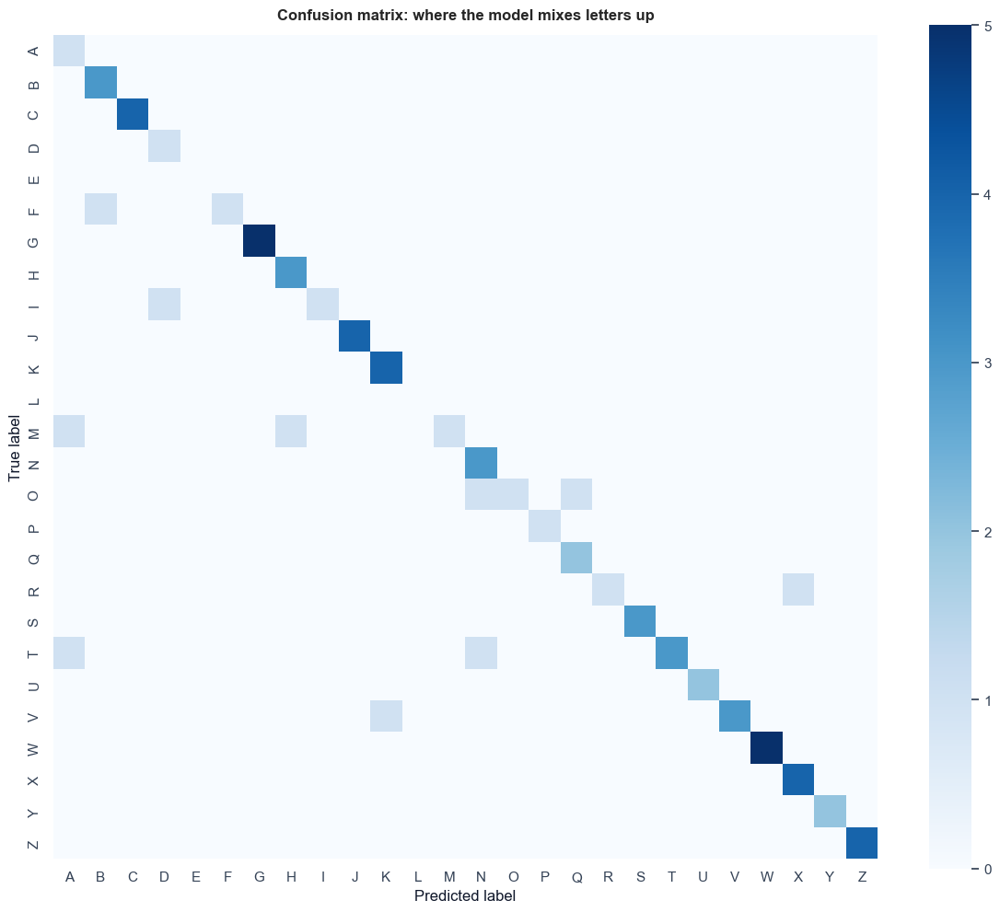

In [31]:
conf_matrix = confusion_matrix(test_true, test_pred, labels=all_label_ids)

plt.figure(figsize=(12, 10))
sns.heatmap(
    conf_matrix,
    annot=False,
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    square=True,
)
plt.title("Confusion matrix: where the model mixes letters up")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.tight_layout()
plt.show()


## Per-class confusion analysis

Now I zoom in on the mistakes.

I want to know:
- which letters are confused most often?
- are those confusions visually understandable?
- do weaker classes match earlier imbalance patterns?

This is one of the most useful parts of the report, because it turns raw errors into actual insight.

In [32]:
confusion_pairs = []
for true_index in range(conf_matrix.shape[0]):
    for pred_index in range(conf_matrix.shape[1]):
        if true_index != pred_index and conf_matrix[true_index, pred_index] > 0:
            confusion_pairs.append({
                "true_label": class_names[true_index],
                "predicted_label": class_names[pred_index],
                "count": int(conf_matrix[true_index, pred_index]),
            })

confusion_pairs_df = pd.DataFrame(confusion_pairs).sort_values(by="count", ascending=False)
confusion_pairs_df.head(10)

,true_label,predicted_label,count
0,F,B,1
1,I,D,1
2,M,A,1
3,M,H,1
4,O,N,1
5,O,Q,1
6,R,X,1
7,T,A,1
8,T,N,1
9,V,K,1


### How I discuss the confusing classes

When I look at the top confusion pairs, I keep the discussion simple and human.
Examples:
- these two letters look visually similar in finger position
- one class may have fewer useful training examples
- some gestures differ only by a small local detail
- the crop may still hide subtle shape information

I try to keep the discussion short, honest, and connected to the actual results.

In [33]:
worst_classes = (
    per_class_report.loc[class_names, ["precision", "recall", "f1-score", "support"]]
    .sort_values(by="f1-score")
)
worst_classes.head(10)

,precision,recall,f1-score,support
L,0.000000,0.000000,0.000000,0.0
E,0.000000,0.000000,0.000000,0.0
A,0.333333,1.000000,0.500000,1.0
O,1.000000,0.333333,0.500000,3.0
M,1.000000,0.333333,0.500000,3.0
F,1.000000,0.500000,0.666667,2.0
I,1.000000,0.500000,0.666667,2.0
D,0.500000,1.000000,0.666667,1.0
R,1.000000,0.500000,0.666667,2.0
N,0.600000,1.000000,0.750000,3.0


## Comparative discussion

If I test more than one model, I compare them here.
If I only use one final model, that is also okay.

The important thing is to explain trade-offs like:
- higher accuracy vs slower training
- better macro F1 vs more complexity
- smaller model vs weaker representation power

So this section is less "who won" and more "why did this model behave this way?"

In [34]:
comparison_rows = [
    {
        "model_name": "PyTorch CNN (improved recipe)",
        "test_accuracy": test_accuracy,
        "macro_f1": macro_f1,
        "weighted_f1": weighted_f1,
        "batch_size": BATCH_SIZE,
        "epochs_used": actual_epochs_used,
        "device": str(DEVICE),
    }
]

comparison_df = pd.DataFrame(comparison_rows)
comparison_df


,model_name,test_accuracy,macro_f1,weighted_f1,batch_size,epochs_used,device
0,PyTorch CNN (improved recipe),0.861111,0.762149,0.853461,16,60,mps


### Suggested write-up for the comparison section

If only one final model is used, I can simply say that clearly.
Then I focus on:
- its final accuracy
- its macro and weighted scores
- its weak classes
- its most common confusions
- its practical strengths and weaknesses

Simple writing is fine. Actually, simple writing is usually better.

In [35]:
training_config = {
    "framework": "PyTorch",
    "target_size": TARGET_SIZE,
    "normalization": "divide by 255 -> [0, 1]",
    "batch_size": BATCH_SIZE,
    "max_epochs": MAX_EPOCHS,
    "early_stopping_patience": PATIENCE,
    "learning_rate": LEARNING_RATE,
    "weight_decay": WEIGHT_DECAY,
    "label_smoothing": LABEL_SMOOTHING,
    "optimizer": "AdamW",
    "loss": "CrossEntropyLoss",
    "checkpoint_path": CHECKPOINT_PATH,
    "class_names": class_names,
    "device": str(DEVICE),
}

with open("asl_training_config.json", "w", encoding="utf-8") as f:
    json.dump(training_config, f, indent=2)

print("Training configuration saved to asl_training_config.json")


Training configuration saved to asl_training_config.json


# Advanced Model Insight Section

Now we go from "the model works" to "okay but what is this little guy actually doing?"

This section adds deeper analysis so the report feels more thoughtful and less like a speedrun.

## Helper setup

Here I prepare helper functions and a clean results table.
That way all later analysis uses the same predictions, labels, and confidence values.

One source of truth. Very peaceful.

In [36]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


def softmax_numpy(logits_array: np.ndarray) -> np.ndarray:
    shifted = logits_array - logits_array.max(axis=1, keepdims=True)
    exp_values = np.exp(shifted)
    return exp_values / exp_values.sum(axis=1, keepdims=True)


def collect_predictions_with_logits(model, dataloader):
    model.eval()
    all_labels = []
    all_predictions = []
    all_logits = []

    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            batch_images = batch_images.to(DEVICE)
            logits = model(batch_images)
            predictions = logits.argmax(dim=1).cpu().numpy()

            all_predictions.extend(predictions)
            all_labels.extend(batch_labels.numpy())
            all_logits.append(logits.cpu().numpy())

    all_logits = np.concatenate(all_logits, axis=0)
    return np.array(all_labels), np.array(all_predictions), all_logits


test_true, test_pred, test_logits = collect_predictions_with_logits(model, test_loader)
test_probabilities = softmax_numpy(test_logits)
test_confidence = test_probabilities.max(axis=1)

results_df = pd.DataFrame({
    "true_id": test_true,
    "pred_id": test_pred,
    "true_label": [class_names[index] for index in test_true],
    "pred_label": [class_names[index] for index in test_pred],
    "confidence": test_confidence,
})
results_df["is_correct"] = results_df["true_id"] == results_df["pred_id"]

results_df.head()

,true_id,pred_id,true_label,pred_label,confidence,is_correct
0,22,22,W,W,0.975264,True
1,10,10,K,K,0.962379,True
2,21,21,V,V,0.565304,True
3,18,18,S,S,0.994422,True
4,17,23,R,X,0.298269,False


## 1) Misclassified samples gallery

This is one of the best visual sections in the notebook.
It shows real wrong predictions with their confidence values.

Why it matters:
- numbers become real images
- I can see if errors make sense visually
- I get strong material for report discussion

Sometimes the model is wrong in a very understandable way. Sometimes it is just being dramatic.

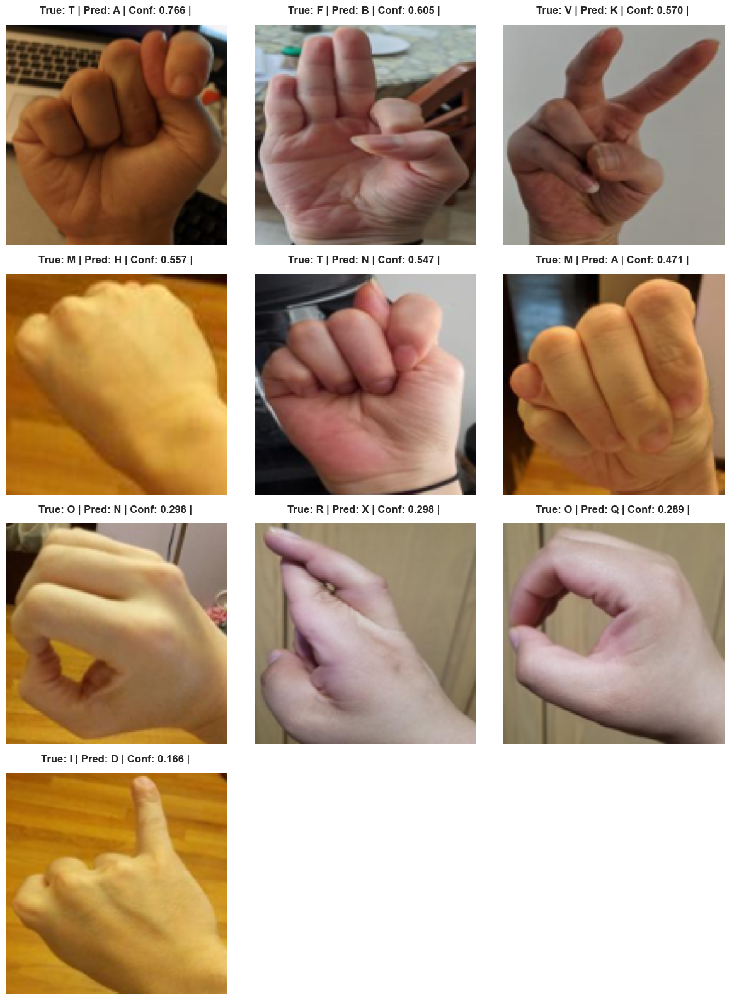

In [54]:
def denormalize_image(image_array: np.ndarray) -> np.ndarray:
    return np.clip(image_array, 0.0, 1.0)


def show_misclassified_samples(images, labels, predictions, confidences, class_names, max_samples=12):
    wrong_indices = np.where(labels != predictions)[0]
    if len(wrong_indices) == 0:
        print("No misclassified samples found. Either the model is cooking, or the universe is being unusually kind today.")
        return

    sorted_indices = wrong_indices[np.argsort(-confidences[wrong_indices])]
    selected_indices = sorted_indices[:max_samples]

    rows = int(np.ceil(len(selected_indices) / 3))
    fig, axes = plt.subplots(rows, 3, figsize=(12, 4 * rows))
    axes = np.atleast_1d(axes).flatten()

    for axis, sample_index in zip(axes, selected_indices):
        axis.imshow(denormalize_image(images[sample_index]))
        axis.set_title(
            f"True: {class_names[labels[sample_index]]} | "
            f"Pred: {class_names[predictions[sample_index]]} | "
            f"Conf: {confidences[sample_index]:.3f} | "
        )
        axis.axis("off")

    for axis in axes[len(selected_indices):]:
        axis.axis("off")

    plt.tight_layout()
    plt.show()


show_misclassified_samples(test_images, test_true, test_pred, test_confidence, class_names, max_samples=12)

## 2) Confidence analysis

Here I compare confidence for:
- correct predictions
- wrong predictions

This helps answer a useful question:
Is the model sensibly unsure when it is wrong, or is it confidently wrong like a student who did not study but still argues with the teacher?

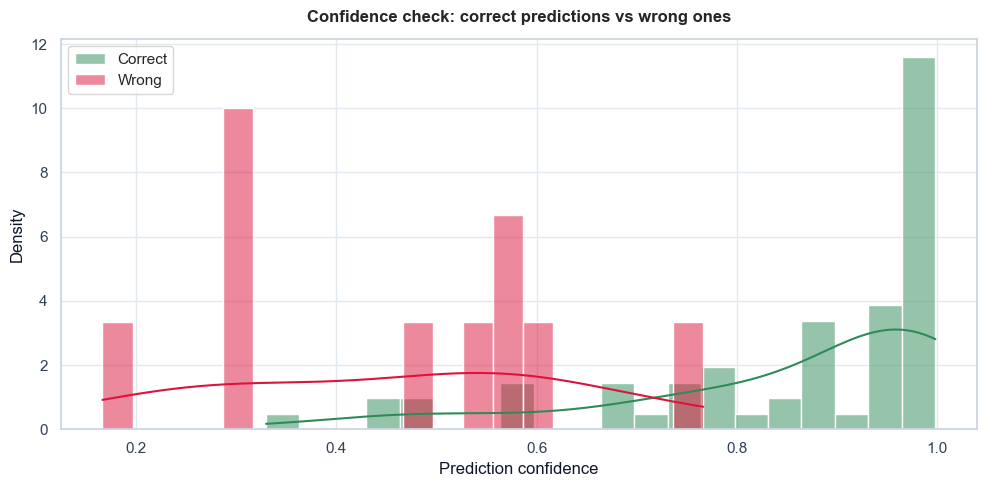

,count,mean,std,min,25%,50%,75%,max
is_correct,,,,,,,,
False,10.0,0.456838,0.186144,0.166339,0.29827,0.509035,0.567062,0.766207
True,62.0,0.850453,0.172165,0.329634,0.76490,0.940300,0.975067,0.997942


In [38]:
plt.figure(figsize=(10, 5))
sns.histplot(results_df[results_df["is_correct"]]["confidence"], color="seagreen", label="Correct", bins=20, kde=True, stat="density", alpha=0.5)
sns.histplot(results_df[~results_df["is_correct"]]["confidence"], color="crimson", label="Wrong", bins=20, kde=True, stat="density", alpha=0.5)
plt.title("Confidence check: correct predictions vs wrong ones")
plt.xlabel("Prediction confidence")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()

results_df.groupby("is_correct")["confidence"].describe()

## 3) Per-class accuracy bar plot

This plot is super report-friendly.
It quickly shows:
- which letters are easy for the model
- which letters are difficult
- whether performance is balanced across classes

If some bars are much lower, mention them. They are waving for attention.

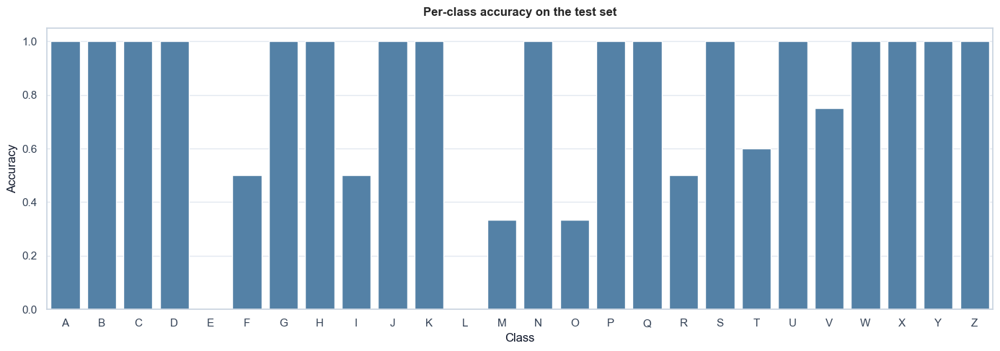

,class_name,accuracy,support
12,M,0.333333,3
14,O,0.333333,3
5,F,0.500000,2
8,I,0.500000,2
17,R,0.500000,2
19,T,0.600000,5
21,V,0.750000,4
0,A,1.000000,1
23,X,1.000000,4
22,W,1.000000,5


In [39]:
per_class_accuracy_rows = []
for class_id, class_name in enumerate(class_names):
    class_mask = test_true == class_id
    support = int(class_mask.sum())
    accuracy_value = (test_pred[class_mask] == test_true[class_mask]).mean() if support > 0 else np.nan
    per_class_accuracy_rows.append({
        "class_name": class_name,
        "accuracy": accuracy_value,
        "support": support,
    })

per_class_accuracy_df = pd.DataFrame(per_class_accuracy_rows)

plt.figure(figsize=(14, 5))
sns.barplot(data=per_class_accuracy_df, x="class_name", y="accuracy", color="steelblue")
plt.title("Per-class accuracy on the test set")
plt.xlabel("Class")
plt.ylabel("Accuracy")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()

per_class_accuracy_df.sort_values(by="accuracy").head(10)

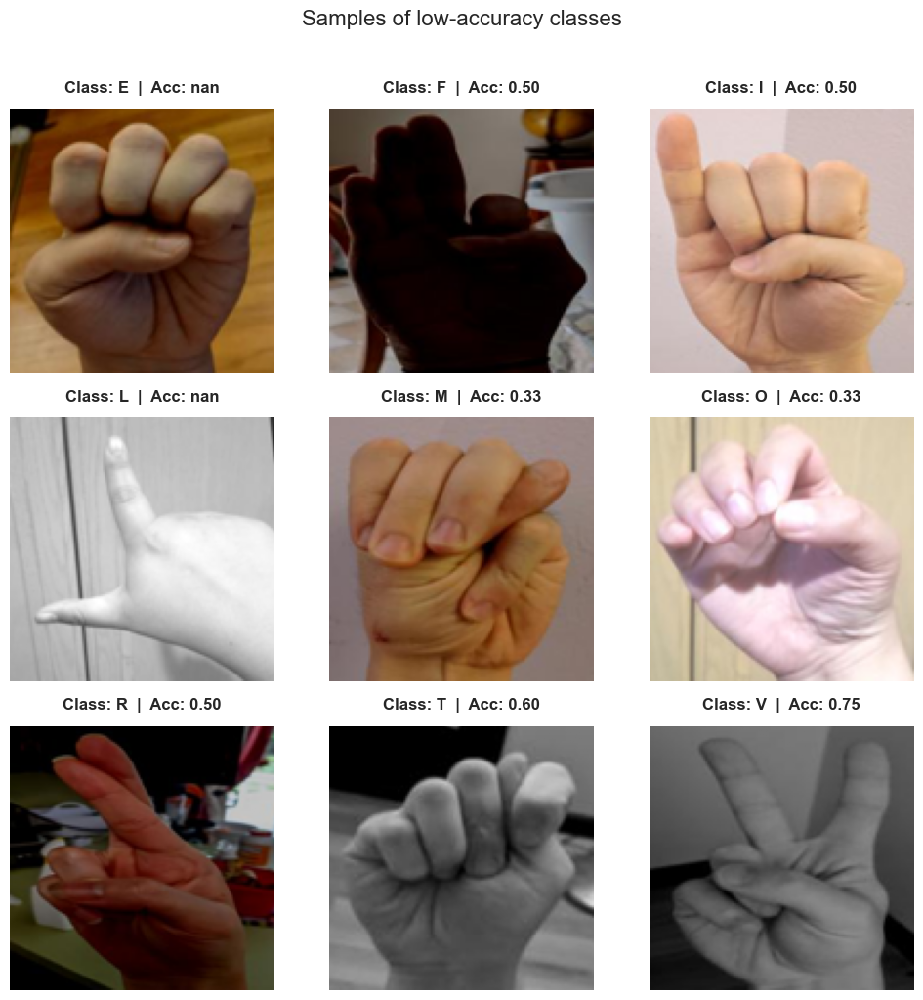

In [59]:
target_classes = ['E', 'F', 'I', 'L', 'M', 'O', 'R', 'T', 'V']

selected_indices = []
for label in target_classes:
    idx = np.where(train_labels == label)[0]
    if len(idx) > 0:
        selected_indices.append(idx[0])

fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for axis, label, index in zip(axes.flat, target_classes, selected_indices):
    axis.imshow(train_images[index])
    
    row = per_class_accuracy_df[per_class_accuracy_df['class_name'] == label]
    acc_value = row['accuracy'].values[0] if not row.empty else 0.0
    
    axis.set_title(f"Class: {label}  |  Acc: {acc_value:.2f}")
    axis.axis("off")

plt.suptitle("Samples of low-accuracy classes", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


## 4) Top confusion pair examples

The confusion matrix tells me which classes get mixed up.
This section makes that more concrete by showing real examples from the most confused pairs.

This is great for explaining mistakes in a way normal humans can actually see.

Let us inspect the top confusion pair closely:
true_label         F
predicted_label    B
count              1
Name: 0, dtype: object


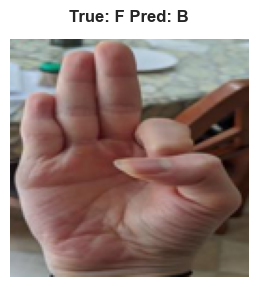

In [40]:
def show_confusion_pair_examples(images, true_labels, pred_labels, class_names, true_class_name, pred_class_name, max_samples=6):
    true_class_id = class_names.index(true_class_name)
    pred_class_id = class_names.index(pred_class_name)
    indices = np.where((true_labels == true_class_id) & (pred_labels == pred_class_id))[0]

    if len(indices) == 0:
        print(f"No examples found for {true_class_name} misclassified as {pred_class_name}.")
        return

    selected_indices = indices[:max_samples]
    fig, axes = plt.subplots(1, len(selected_indices), figsize=(3 * len(selected_indices), 3))
    axes = np.atleast_1d(axes)

    for axis, sample_index in zip(axes, selected_indices):
        axis.imshow(denormalize_image(images[sample_index]))
        axis.set_title(f"True: {true_class_name} Pred: {pred_class_name}")
        axis.axis("off")

    plt.tight_layout()
    plt.show()


if len(confusion_pairs_df) > 0:
    top_pair = confusion_pairs_df.iloc[0]
    print("Let us inspect the top confusion pair closely:")
    print(top_pair)
    show_confusion_pair_examples(
        test_images,
        test_true,
        test_pred,
        class_names,
        true_class_name=top_pair["true_label"],
        pred_class_name=top_pair["predicted_label"],
        max_samples=6,
    )
else:
    print("No confusion pairs found.")

## 5) Grad-CAM: where the model is looking

Grad-CAM helps show where the CNN is focusing when it makes a prediction.

This is very useful because I can check whether the model is looking at:
- fingers
- palm shape
- useful gesture areas

If the heatmap focuses on the hand, good.
If it focuses on random background, then we have trust issues.

In [41]:
def get_last_conv_layer(model):
    for module in reversed(list(model.features)):
        if isinstance(module, ResidualBlock):
            return module
    raise ValueError("Could not find a suitable convolution block for Grad-CAM.")


class GradCAM:
    def __init__(self, model, target_module):
        self.model = model
        self.target_module = target_module
        self.activations = None
        self.gradients = None
        self.forward_hook = target_module.register_forward_hook(self.save_activation)
        self.backward_hook = target_module.register_full_backward_hook(self.save_gradient)

    def save_activation(self, module, inputs, output):
        self.activations = output

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        output = self.model(input_tensor)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        self.model.zero_grad()
        target_score = output[:, target_class]
        target_score.backward()

        gradients = self.gradients[0].detach().cpu().numpy()
        activations = self.activations[0].detach().cpu().numpy()
        weights = gradients.mean(axis=(1, 2))

        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for channel_index, weight in enumerate(weights):
            cam += weight * activations[channel_index]

        cam = np.maximum(cam, 0)
        if cam.max() > 0:
            cam = cam / cam.max()
        return cam, target_class

    def close(self):
        self.forward_hook.remove()
        self.backward_hook.remove()

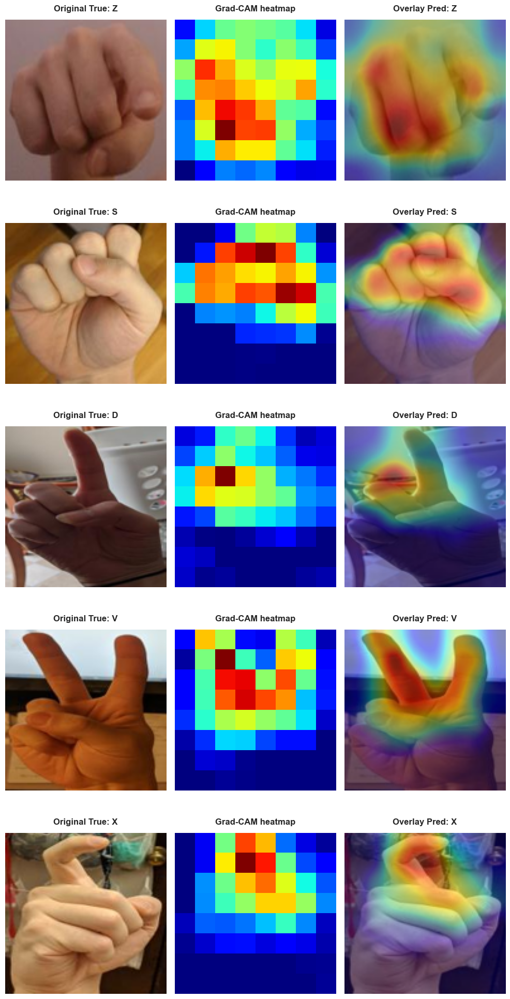

In [42]:
def overlay_heatmap_on_image(image_array: np.ndarray, heatmap: np.ndarray, alpha=0.4):
    image_uint8 = (np.clip(image_array, 0, 1) * 255).astype(np.uint8)
    base_image = Image.fromarray(image_uint8).convert("RGB")

    heatmap_uint8 = (heatmap * 255).astype(np.uint8)
    heatmap_image = Image.fromarray(heatmap_uint8).resize(base_image.size)

    heatmap_colored = plt.cm.jet(np.array(heatmap_image) / 255.0)[..., :3]
    heatmap_colored = (heatmap_colored * 255).astype(np.uint8)
    heatmap_colored = Image.fromarray(heatmap_colored)

    blended = Image.blend(base_image, heatmap_colored, alpha=alpha)
    return np.array(blended)


def show_gradcam_examples(model, images, labels, predictions, class_names, sample_count=6):
    target_module = get_last_conv_layer(model)
    gradcam = GradCAM(model, target_module)

    selected_indices = np.random.choice(len(images), size=min(sample_count, len(images)), replace=False)
    fig, axes = plt.subplots(len(selected_indices), 3, figsize=(10, 4 * len(selected_indices)))
    if len(selected_indices) == 1:
        axes = np.array([axes])

    for row_index, sample_index in enumerate(selected_indices):
        image = images[sample_index]
        input_tensor = torch.tensor(image.transpose(2, 0, 1), dtype=torch.float32).unsqueeze(0).to(DEVICE)
        heatmap, predicted_class = gradcam.generate(input_tensor, target_class=int(predictions[sample_index]))
        overlay = overlay_heatmap_on_image(image, heatmap)

        axes[row_index, 0].imshow(image)
        axes[row_index, 0].set_title(f"Original True: {class_names[labels[sample_index]]}")
        axes[row_index, 0].axis("off")

        axes[row_index, 1].imshow(heatmap, cmap="jet")
        axes[row_index, 1].set_title("Grad-CAM heatmap")
        axes[row_index, 1].axis("off")

        axes[row_index, 2].imshow(overlay)
        axes[row_index, 2].set_title(f"Overlay Pred: {class_names[predicted_class]}")
        axes[row_index, 2].axis("off")

    gradcam.close()
    plt.tight_layout()
    plt.show()


show_gradcam_examples(model, test_images, test_true, test_pred, class_names, sample_count=5)

## 6) Saliency maps

Saliency maps show which pixels matter most for the prediction.
They are usually noisier than Grad-CAM, but still useful.

So I use them as a second view:
- Grad-CAM for region-level attention
- saliency for pixel-level sensitivity

Two opinions are better than one. Unless both are terrible.

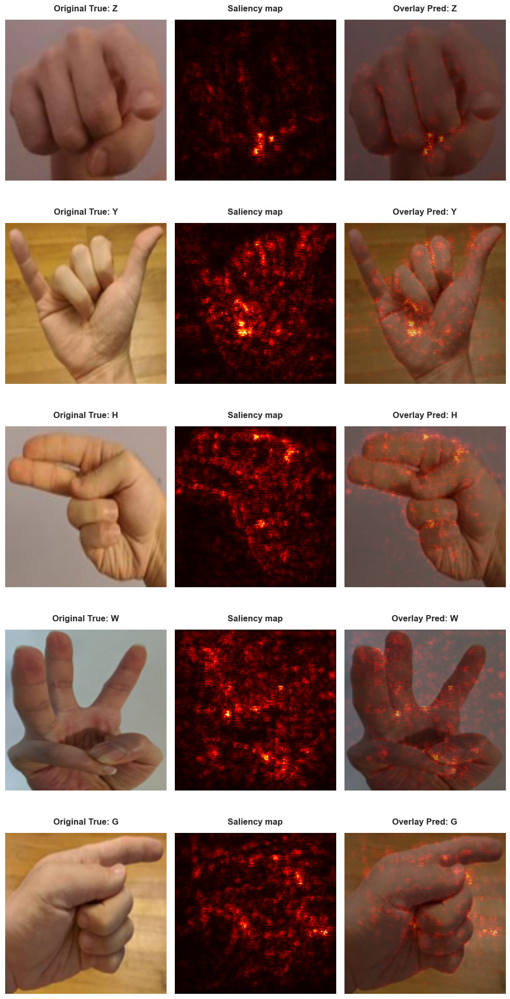

In [43]:
def compute_saliency_map(model, image_array: np.ndarray, target_class: int):
    model.eval()
    input_tensor = torch.tensor(image_array.transpose(2, 0, 1), dtype=torch.float32).unsqueeze(0).to(DEVICE)
    input_tensor.requires_grad_(True)

    output = model(input_tensor)
    target_score = output[:, target_class]

    model.zero_grad()
    target_score.backward()

    saliency = input_tensor.grad.detach().abs().cpu().numpy()[0]
    saliency = saliency.max(axis=0)
    if saliency.max() > 0:
        saliency = saliency / saliency.max()
    return saliency


def show_saliency_examples(model, images, labels, predictions, class_names, sample_count=5):
    selected_indices = np.random.choice(len(images), size=min(sample_count, len(images)), replace=False)
    fig, axes = plt.subplots(len(selected_indices), 3, figsize=(10, 4 * len(selected_indices)))
    if len(selected_indices) == 1:
        axes = np.array([axes])

    for row_index, sample_index in enumerate(selected_indices):
        image = images[sample_index]
        predicted_class = int(predictions[sample_index])
        saliency = compute_saliency_map(model, image, predicted_class)

        axes[row_index, 0].imshow(image)
        axes[row_index, 0].set_title(f"Original True: {class_names[labels[sample_index]]}")
        axes[row_index, 0].axis("off")

        axes[row_index, 1].imshow(saliency, cmap="hot")
        axes[row_index, 1].set_title("Saliency map")
        axes[row_index, 1].axis("off")

        axes[row_index, 2].imshow(image)
        axes[row_index, 2].imshow(saliency, cmap="hot", alpha=0.45)
        axes[row_index, 2].set_title(f"Overlay Pred: {class_names[predicted_class]}")
        axes[row_index, 2].axis("off")

    plt.tight_layout()
    plt.show()


show_saliency_examples(model, test_images, test_true, test_pred, class_names, sample_count=5)

## 7) Feature-space visualization with PCA and t-SNE

Here I visualize the learned feature vectors.

If the model learned useful structure, samples from the same class should often appear closer together.
If some classes overlap heavily, that can explain confusion later.

This part looks fancy, but it is also genuinely useful. Rare combo.

In [44]:
def extract_features(model, dataloader):
    model.eval()
    all_features = []
    all_labels = []

    with torch.no_grad():
        for batch_images, batch_labels in dataloader:
            batch_images = batch_images.to(DEVICE)
            features = model.stem(batch_images)
            features = model.features(features)
            features = nn.functional.adaptive_avg_pool2d(features, (1, 1))
            features = features.view(features.size(0), -1)

            all_features.append(features.cpu().numpy())
            all_labels.extend(batch_labels.numpy())

    all_features = np.concatenate(all_features, axis=0)
    all_labels = np.array(all_labels)
    return all_features, all_labels


test_features, test_feature_labels = extract_features(model, test_loader)
print("Feature matrix shape:", test_features.shape)

Feature matrix shape: (72, 256)


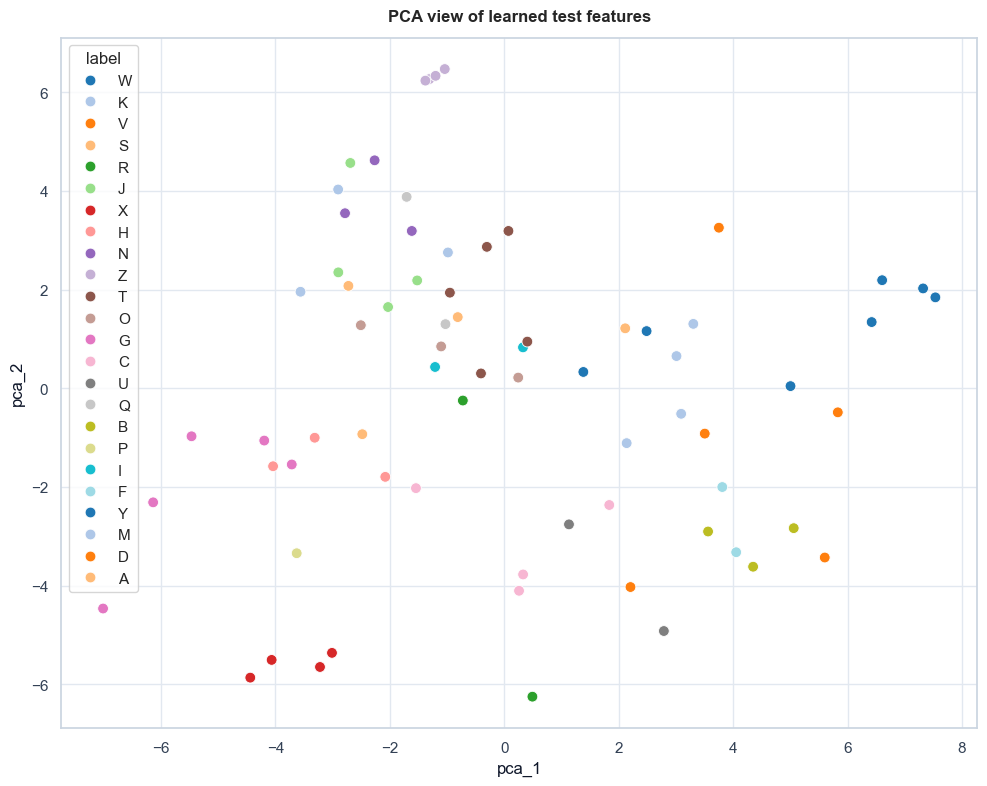

In [45]:
pca = PCA(n_components=2, random_state=SEED)
pca_features = pca.fit_transform(test_features)

feature_plot_df = pd.DataFrame({
    "pca_1": pca_features[:, 0],
    "pca_2": pca_features[:, 1],
    "label": [class_names[index] for index in test_feature_labels],
})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=feature_plot_df, x="pca_1", y="pca_2", hue="label", palette="tab20", s=60)
plt.title("PCA view of learned test features")
plt.tight_layout()
plt.show()

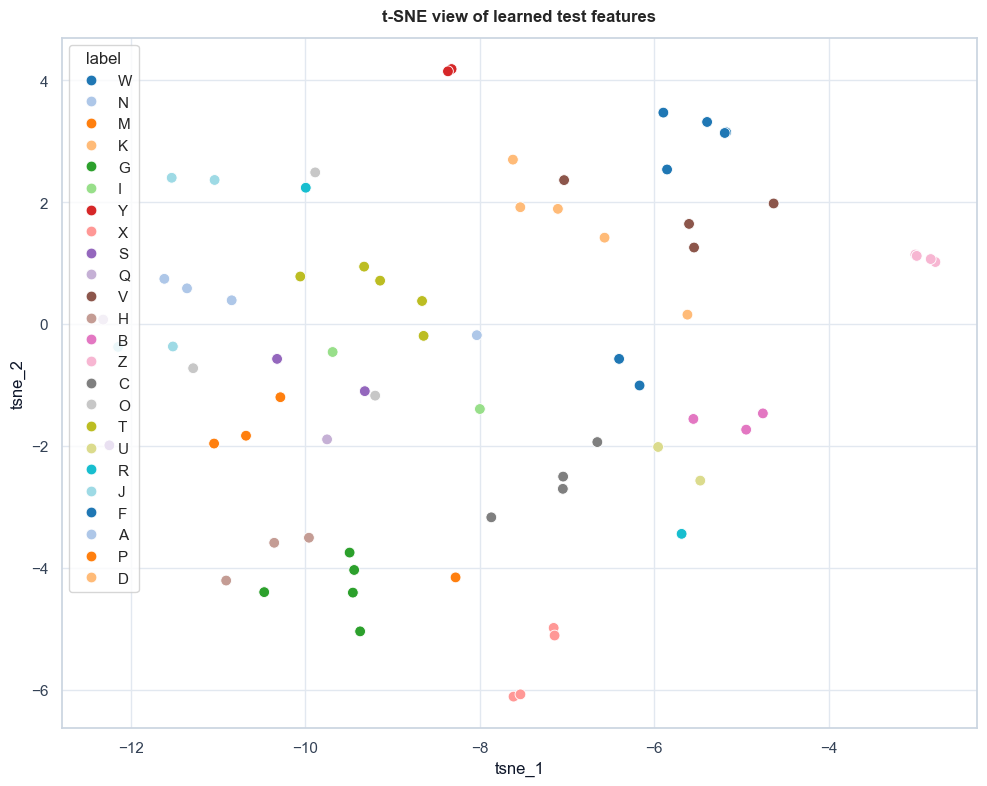

In [46]:
subset_size = min(300, len(test_features))
subset_indices = np.random.choice(len(test_features), size=subset_size, replace=False)

tsne = TSNE(n_components=2, random_state=SEED, perplexity=min(30, subset_size - 1), init="pca", learning_rate="auto")
tsne_features = tsne.fit_transform(test_features[subset_indices])

tsne_plot_df = pd.DataFrame({
    "tsne_1": tsne_features[:, 0],
    "tsne_2": tsne_features[:, 1],
    "label": [class_names[index] for index in test_feature_labels[subset_indices]],
})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_plot_df, x="tsne_1", y="tsne_2", hue="label", palette="tab20", s=60)
plt.title("t-SNE view of learned test features")
plt.tight_layout()
plt.show()

## 8) Crop vs model focus comparison

This section is very nice for the report.
It compares:
- the cropped input image
- the attention heatmap
- the overlay result

This helps me argue whether the model is focusing on meaningful hand regions instead of random nonsense.

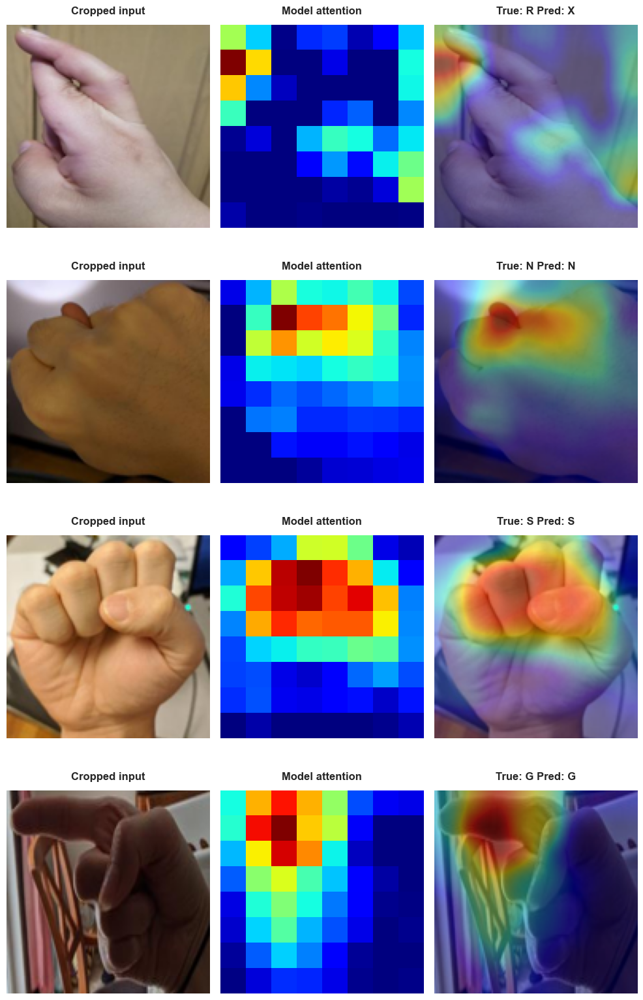

In [47]:
def show_focus_summary(model, images, labels, predictions, class_names, sample_count=4):
    target_module = get_last_conv_layer(model)
    gradcam = GradCAM(model, target_module)
    selected_indices = np.random.choice(len(images), size=min(sample_count, len(images)), replace=False)

    fig, axes = plt.subplots(sample_count, 3, figsize=(10, 4 * sample_count))
    if sample_count == 1:
        axes = np.array([axes])

    for row_index, sample_index in enumerate(selected_indices):
        image = images[sample_index]
        input_tensor = torch.tensor(image.transpose(2, 0, 1), dtype=torch.float32).unsqueeze(0).to(DEVICE)
        heatmap, predicted_class = gradcam.generate(input_tensor, target_class=int(predictions[sample_index]))
        overlay = overlay_heatmap_on_image(image, heatmap)

        axes[row_index, 0].imshow(image)
        axes[row_index, 0].set_title("Cropped input")
        axes[row_index, 0].axis("off")

        axes[row_index, 1].imshow(heatmap, cmap="jet")
        axes[row_index, 1].set_title("Model attention")
        axes[row_index, 1].axis("off")

        axes[row_index, 2].imshow(overlay)
        axes[row_index, 2].set_title(f"True: {class_names[labels[sample_index]]} Pred: {class_names[predicted_class]}")
        axes[row_index, 2].axis("off")

    gradcam.close()
    plt.tight_layout()
    plt.show()


show_focus_summary(model, test_images, test_true, test_pred, class_names, sample_count=4)

# Hyperparameter Search: 4 Model Versions

Now I want to test a few training setups instead of trusting one random configuration like it is a prophet.

Yes, I think increasing `MAX_EPOCHS` to **100** is a good idea **if** I keep early stopping.
That way the model gets enough time to improve, but it does not keep training forever if validation performance stops getting better.

So in this section I test **4 model versions** and then keep the best one based on validation accuracy.

## Why these values are worth testing

My current setup is:
- `BATCH_SIZE = 16`
- `MAX_EPOCHS = 60`
- `PATIENCE = 10`
- `LEARNING_RATE = 8e-4`
- `WEIGHT_DECAY = 1e-4`
- `LABEL_SMOOTHING = 0.05`

These are already reasonable, but I still want to test a few nearby values.

The main ideas are:
- smaller or larger batch size may change training stability
- a slightly smaller learning rate may improve validation performance
- a little more or less regularization may help generalization
- lighter or stronger label smoothing may affect confidence and accuracy

I am not doing a huge grid search because I am on a Mac, not inside a NASA server room.

In [48]:
EXPERIMENT_CONFIGS = [
    {
        "name": "model_1_baseline_plus",
        "batch_size": 16,
        "max_epochs": 100,
        "patience": 12,
        "learning_rate": 8e-4,
        "weight_decay": 1e-4,
        "label_smoothing": 0.05,
    },
    {
        "name": "model_2_lower_lr",
        "batch_size": 16,
        "max_epochs": 100,
        "patience": 12,
        "learning_rate": 5e-4,
        "weight_decay": 1e-4,
        "label_smoothing": 0.05,
    },
    {
        "name": "model_3_larger_batch",
        "batch_size": 32,
        "max_epochs": 100,
        "patience": 12,
        "learning_rate": 8e-4,
        "weight_decay": 1e-4,
        "label_smoothing": 0.03,
    },
    {
        "name": "model_4_more_regularized",
        "batch_size": 16,
        "max_epochs": 100,
        "patience": 12,
        "learning_rate": 6e-4,
        "weight_decay": 2e-4,
        "label_smoothing": 0.08,
    },
]

pd.DataFrame(EXPERIMENT_CONFIGS)

,name,batch_size,max_epochs,patience,learning_rate,weight_decay,label_smoothing
0,model_1_baseline_plus,16,100,12,0.0008,0.0001,0.05
1,model_2_lower_lr,16,100,12,0.0005,0.0001,0.05
2,model_3_larger_batch,32,100,12,0.0008,0.0001,0.03
3,model_4_more_regularized,16,100,12,0.0006,0.0002,0.08


## Training helper for one experiment

I use the same model architecture each time.
Only the training hyperparameters change.
That makes the comparison fair.

In [49]:
def make_dataloaders_for_config(config):
    train_dataset_local = ASLDataset(train_images, train_label_ids, training=True)
    valid_dataset_local = ASLDataset(valid_images, valid_label_ids, training=False)
    test_dataset_local = ASLDataset(test_images, test_label_ids, training=False)

    train_loader_local = DataLoader(
        train_dataset_local,
        batch_size=config["batch_size"],
        shuffle=True,
        num_workers=0,
    )
    valid_loader_local = DataLoader(
        valid_dataset_local,
        batch_size=config["batch_size"],
        shuffle=False,
        num_workers=0,
    )
    test_loader_local = DataLoader(
        test_dataset_local,
        batch_size=config["batch_size"],
        shuffle=False,
        num_workers=0,
    )
    return train_loader_local, valid_loader_local, test_loader_local


def train_one_experiment(config):
    train_loader_local, valid_loader_local, test_loader_local = make_dataloaders_for_config(config)

    model_local = ASLCNN(num_classes=num_classes).to(DEVICE)
    criterion_local = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=config["label_smoothing"])
    optimizer_local = torch.optim.AdamW(
        model_local.parameters(),
        lr=config["learning_rate"],
        weight_decay=config["weight_decay"],
    )
    scheduler_local = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer_local,
        mode="min",
        factor=0.5,
        patience=3,
        min_lr=1e-6,
    )

    best_state = None
    best_epoch = 0
    best_valid_loss = float("inf")
    best_valid_accuracy = -1.0
    patience_counter = 0
    history_local = []

    for epoch in range(1, config["max_epochs"] + 1):
        current_lr = optimizer_local.param_groups[0]["lr"]
        train_loss, train_accuracy = run_one_epoch(model_local, train_loader_local, criterion_local, optimizer_local)
        valid_loss, valid_accuracy = run_one_epoch(model_local, valid_loader_local, criterion_local, optimizer=None)
        scheduler_local.step(valid_loss)

        history_local.append({
            "epoch": epoch,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "valid_loss": valid_loss,
            "valid_accuracy": valid_accuracy,
            "learning_rate": current_lr,
        })

        print(
            f"{config['name']} | epoch {epoch:03d}/{config['max_epochs']} | "
            f"lr={current_lr:.6f} | train_acc={train_accuracy:.4f} | valid_acc={valid_accuracy:.4f} | valid_loss={valid_loss:.4f}"
        )

        if valid_accuracy > best_valid_accuracy:
            best_valid_accuracy = valid_accuracy
            best_valid_loss = valid_loss
            best_state = copy.deepcopy(model_local.state_dict())
            best_epoch = epoch
            patience_counter = 0
            print("  New best validation accuracy. Nice.")
        elif valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"  patience counter: {patience_counter}/{config['patience']}")

        if patience_counter >= config["patience"]:
            print("  Early stopping fired. Good, my laptop survives another day.")
            break

    model_local.load_state_dict(best_state)

    valid_true_local, valid_pred_local, _ = collect_predictions_with_logits(model_local, valid_loader_local)
    test_true_local, test_pred_local, _ = collect_predictions_with_logits(model_local, test_loader_local)

    valid_accuracy_final = accuracy_score(valid_true_local, valid_pred_local)
    test_accuracy_final = accuracy_score(test_true_local, test_pred_local)
    macro_precision_local, macro_recall_local, macro_f1_local, _ = precision_recall_fscore_support(
        test_true_local,
        test_pred_local,
        labels=all_label_ids,
        average="macro",
        zero_division=0,
    )
    weighted_precision_local, weighted_recall_local, weighted_f1_local, _ = precision_recall_fscore_support(
        test_true_local,
        test_pred_local,
        labels=all_label_ids,
        average="weighted",
        zero_division=0,
    )

    result = {
        "name": config["name"],
        "batch_size": config["batch_size"],
        "max_epochs": config["max_epochs"],
        "patience": config["patience"],
        "learning_rate": config["learning_rate"],
        "weight_decay": config["weight_decay"],
        "label_smoothing": config["label_smoothing"],
        "epochs_used": len(history_local),
        "best_epoch": best_epoch,
        "valid_accuracy": valid_accuracy_final,
        "test_accuracy": test_accuracy_final,
        "macro_precision": macro_precision_local,
        "macro_recall": macro_recall_local,
        "macro_f1": macro_f1_local,
        "weighted_precision": weighted_precision_local,
        "weighted_recall": weighted_recall_local,
        "weighted_f1": weighted_f1_local,
        "model_state": best_state,
        "history": history_local,
    }
    return result

## Run the 4 experiments

This cell may take time on my machine, so I only run it when I am ready.
At the end, I compare all four versions and keep the best one.

In [50]:
experiment_results = []

for config in EXPERIMENT_CONFIGS:
    print("" + "=" * 90)
    print(f"Starting {config['name']}")
    print("=" * 90)
    result = train_one_experiment(config)
    experiment_results.append(result)

experiment_summary = pd.DataFrame([
    {
        key: value for key, value in result.items()
        if key not in {"model_state", "history"}
    }
    for result in experiment_results
]).sort_values(by=["valid_accuracy", "test_accuracy", "macro_f1"], ascending=False)

experiment_summary

Starting model_1_baseline_plus
model_1_baseline_plus | epoch 001/100 | lr=0.000800 | train_acc=0.0509 | valid_acc=0.0833 | valid_loss=3.4723
  New best validation accuracy. Nice.
model_1_baseline_plus | epoch 002/100 | lr=0.000800 | train_acc=0.0701 | valid_acc=0.0694 | valid_loss=3.1614
model_1_baseline_plus | epoch 003/100 | lr=0.000800 | train_acc=0.0933 | valid_acc=0.0764 | valid_loss=3.1338
model_1_baseline_plus | epoch 004/100 | lr=0.000800 | train_acc=0.0899 | valid_acc=0.0903 | valid_loss=3.0346
  New best validation accuracy. Nice.
model_1_baseline_plus | epoch 005/100 | lr=0.000800 | train_acc=0.0999 | valid_acc=0.1250 | valid_loss=2.9562
  New best validation accuracy. Nice.
model_1_baseline_plus | epoch 006/100 | lr=0.000800 | train_acc=0.1091 | valid_acc=0.1111 | valid_loss=2.9200
model_1_baseline_plus | epoch 007/100 | lr=0.000800 | train_acc=0.1138 | valid_acc=0.1528 | valid_loss=2.9507
  New best validation accuracy. Nice.
model_1_baseline_plus | epoch 008/100 | lr=0.00

,name,batch_size,max_epochs,patience,learning_rate,weight_decay,label_smoothing,epochs_used,best_epoch,valid_accuracy,test_accuracy,macro_precision,macro_recall,macro_f1,weighted_precision,weighted_recall,weighted_f1
3,model_4_more_regularized,16,100,12,0.0006,0.0002,0.08,71,59,0.888889,0.805556,0.749359,0.757051,0.724573,0.829167,0.805556,0.793827
1,model_2_lower_lr,16,100,12,0.0005,0.0001,0.05,85,73,0.875000,0.791667,0.767628,0.736538,0.713621,0.845255,0.791667,0.783677
0,model_1_baseline_plus,16,100,12,0.0008,0.0001,0.05,100,84,0.868056,0.819444,0.782692,0.766667,0.745221,0.843287,0.819444,0.804798
2,model_3_larger_batch,32,100,12,0.0008,0.0001,0.03,91,74,0.861111,0.777778,0.695513,0.740385,0.699251,0.778935,0.777778,0.764917


![time](./images/x3.png)

The Memory is chilling at 9%, while the Processor is fighting for its life at 94%. True teamwork!!! It’s working harder on this CNN than I did during my entire finals week.

![gpu](./images/x1.png)

## Pick the best model

I select the best model mainly by validation accuracy.
That makes sense because test accuracy should stay untouched until evaluation time.

If two models are very close, I can also look at macro F1 as a tie-breaker.

In [51]:
best_experiment_name = experiment_summary.iloc[0]["name"]
best_experiment = next(result for result in experiment_results if result["name"] == best_experiment_name)

print("Best experiment:", best_experiment_name)
print("Best validation accuracy:", f"{best_experiment['valid_accuracy']:.4f}")
print("Best test accuracy:", f"{best_experiment['test_accuracy']:.4f}")
print("Best macro F1:", f"{best_experiment['macro_f1']:.4f}")

model.load_state_dict(best_experiment["model_state"])
print("The notebook model variable now holds the best experiment weights.")

Best experiment: model_4_more_regularized
Best validation accuracy: 0.8889
Best test accuracy: 0.8056
Best macro F1: 0.7246
The notebook model variable now holds the best experiment weights.


## Plot the 4-model comparison

This makes the comparison easier to read in the report.

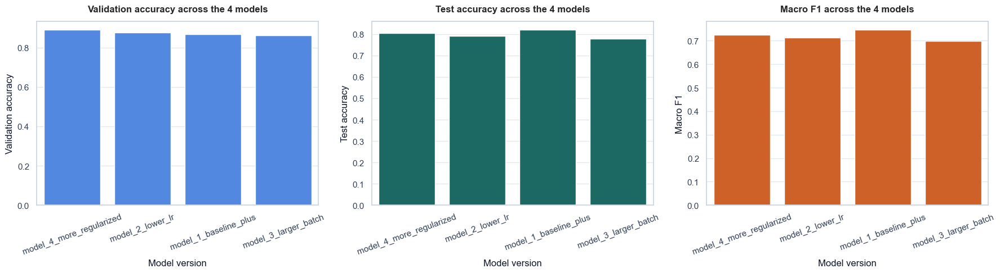

In [52]:
plot_df = experiment_summary.copy()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.barplot(data=plot_df, x="name", y="valid_accuracy", ax=axes[0], color="#3b82f6")
axes[0].set_title("Validation accuracy across the 4 models")
axes[0].set_xlabel("Model version")
axes[0].set_ylabel("Validation accuracy")
axes[0].tick_params(axis="x", rotation=20)

sns.barplot(data=plot_df, x="name", y="test_accuracy", ax=axes[1], color="#0f766e")
axes[1].set_title("Test accuracy across the 4 models")
axes[1].set_xlabel("Model version")
axes[1].set_ylabel("Test accuracy")
axes[1].tick_params(axis="x", rotation=20)

sns.barplot(data=plot_df, x="name", y="macro_f1", ax=axes[2], color="#ea580c")
axes[2].set_title("Macro F1 across the 4 models")
axes[2].set_xlabel("Model version")
axes[2].set_ylabel("Macro F1")
axes[2].tick_params(axis="x", rotation=20)

plt.tight_layout()
plt.show()

## What I can say in the report

This experiment section gives me a clean comparison story.
I can write things like:
- I tested four nearby hyperparameter settings instead of relying on a single setup.
- I increased the maximum epoch budget to `100`, but I kept early stopping to avoid useless extra training.
- I selected the final model using validation accuracy.
- Then I reported the final test metrics for the best configuration.

This sounds much better than saying "I changed some numbers and hoped for the best." Which, to be fair, is sometimes the secret plot of machine learning.